In [10]:
import pandas
import multiprocessing
from multiprocessing import Process
import xarray
import requests
import datetime
import numpy as np
from tqdm import tqdm as tqdm
from tqdm import tqdm_notebook
import gmaps
import os
import scipy
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from math import cos, asin, sqrt
import pandas as pd
import warnings 
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
import plotly.express as px
import datetime
from sklearn.ensemble import GradientBoostingClassifier
import catboost
from catboost import CatBoostClassifier
from sklearn.model_selection import cross_val_score
warnings.simplefilter('ignore')

## NCEP Dataset

Погодные данные из проекта [NCEP Reanalysis 2](https://www.esrl.noaa.gov/psd/data/gridded/data.ncep.reanalysis2.html) — усреднённые за день температура воздуха, относительная влажность и компоненты ветра. Данные можно получить с 1979 года.

Загрузите наборы данных в каталог `data/ncep/`:
- https://www.esrl.noaa.gov/psd/thredds/fileServer/Datasets/ncep/air.2018.nc
- https://www.esrl.noaa.gov/psd/thredds/fileServer/Datasets/ncep/uwnd.2018.nc
- https://www.esrl.noaa.gov/psd/thredds/fileServer/Datasets/ncep/rhum.2018.nc

In [11]:
all_nceps = [[], [], [], [], [], [], [], []]
years = [2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
assert len(all_nceps) == len(years)
for index, year in enumerate(years):
    for var in ('air', 'uwnd', 'rhum'):
        dataset_filename = './data/{}.{}.nc'.format(var, year)
        all_nceps[index].append(xarray.open_dataset(dataset_filename))
    all_nceps[index] = xarray.merge(all_nceps[index])

## Набор признаков на основе данных NCEP

Ищем наиболее близкий к точке узел сетки в наборе NCEP, в качестве признаков значения переменных зарегистрированные в день регистрации точки и агрегированные показатели за период от 1 до 3х недель до момента регистрации точки.

In [12]:
def extract_features(row, index):
    point = all_nceps[index].sel(
        lon=row['longitude'],
        lat=row['latitude'],
        level=1000,
        method='nearest',
    )

    p3w = point.rolling(time=21).mean()
    p1d = point.rolling(time=1).mean()
    p2d = point.rolling(time=2).mean()
    p3d = point.rolling(time=3).mean()
    p1w = point.rolling(time=7).mean()
    p2w = point.rolling(time=14).mean()
    
    p3wm = point.rolling(time=21).median()
    p1dm = point.rolling(time=1).median()
    p2dm = point.rolling(time=2).median()
    p3dm = point.rolling(time=3).median()
    p1wm = point.rolling(time=7).median()
    p2wm = point.rolling(time=14).median()
    
    date = row['date']
    
    dt = datetime.date(int(date[:4]), int(date[5:7]), int(date[8:10]))
    v = point.sel(time=date)
    v1w = p1w.sel(time=date)
    v2w = p2w.sel(time=date)
    v3w = p3w.sel(time=date)
    v1d = p1d.sel(time=date)
    v2d = p2d.sel(time=date)
    v3d = p3d.sel(time=date)
    
    v1wm = p1w.sel(time=date)
    v2wm = p2w.sel(time=date)
    v3wm = p3w.sel(time=date)
    v1dm = p1dm.sel(time=date)
    v2dm = p2dm.sel(time=date)
    v3dm = p3dm.sel(time=date)
    
    return {  
        'fire_id': row['fire_id'],
        'month': dt.month,
        'day': dt.day,
        'fire_type': row['fire_type'],
        'fire_type_name': row['fire_type_name'],
        'longitude': row['longitude'],
        'latitude': row['latitude'],
        'date': row['date'],
        'weekday': dt.weekday(),
        'temperature': v.air.values.item(0),
        'humidity': v.rhum.values.item(0),
        'uwind': v.uwnd.values.item(0),
        't1d_mean': v1d.air.values.item(0),
        't2d_mean': v2d.air.values.item(0),
        't3d_mean': v3d.air.values.item(0),
        'h1d_mean': v1d.rhum.values.item(0),
        'h2d_mean': v2d.rhum.values.item(0),
        'h3d_mean': v3d.rhum.values.item(0),
        't1w_mean': v1w.air.values.item(0),
        't2w_mean': v2w.air.values.item(0),
        't3w_mean': v3w.air.values.item(0),
        'h1w_mean': v1w.rhum.values.item(0),
        'h2w_mean': v2w.rhum.values.item(0),
        'h3w_mean': v3w.rhum.values.item(0),
        't1d_median': v1dm.air.values.item(0),
        't2d_median': v2dm.air.values.item(0),
        't3d_median': v3dm.air.values.item(0),
        'h1d_median': v1dm.rhum.values.item(0),
        'h2d_median': v2dm.rhum.values.item(0),
        'h3d_median': v3dm.rhum.values.item(0),
        't1w_median': v1wm.air.values.item(0),
        't2w_median': v2wm.air.values.item(0),
        't3w_median': v3wm.air.values.item(0),
        'h1w_meadian': v1wm.rhum.values.item(0),
        'h2w_meadian': v2wm.rhum.values.item(0),
        'h3w_meadian': v3wm.rhum.values.item(0)
    }

fire_types_ = ['технолог пр-сс', 'техног пожар', 'горение мусора', 'сжиг-е поруб ост-ов',
'сжиг-е мусора', 'неконтр пал', 'торф пожар', 'лес пожар', 'природ пожар', 'контр пал',
'не подтверждено']

## Выборка для обучения

In [ ]:
df_train = pandas.read_csv('./wildfires-data-train/wildfires_train.csv')

def distance(lat1, lon1, lat2, lon2):
    p = 0.017453292519943295     #Pi/180
    a = 0.5 - cos((lat2 - lat1) * p)/2 + cos(lat1 * p) * cos(lat2 * p) * (1 - cos((lon2 - lon1) * p)) / 2
    return np.log(12742 * asin(sqrt(a))) #2*R*asin...

def get_interval_features(query, index, features_list):
    df_subsample = df_train.query(query)
    df_features = []
    for i, row in tqdm(df_subsample.iterrows(), total=df_subsample.shape[0]):
        features = extract_features(row, index)
        df_features.append(features)
    df_features = pandas.DataFrame(df_features).sort_values('date')
    df_features.set_index('fire_id', inplace=True)
    features_list[index] = df_features

def extract_all_basic_features(queries):
    manager = multiprocessing.Manager()
    return_dict = manager.dict()
    pool = []
    
    for index, query in enumerate(queries):
        pool.append(Process(target=get_interval_features, args=(query, index, return_dict)))
        pool[index].start()

    for thread in pool:
        thread.join()
    
    return return_dict

query1213 = '(date > "2012") & (date < "2013")' #распределение сильно отличается
query1314 = '(date > "2013") & (date < "2014")'
query1415 = '(date > "2014") & (date < "2015")'
query1516 = '(date > "2015") & (date < "2016")'
query1617 = '(date > "2016") & (date < "2017")'
query1718 = '(date > "2017") & (date < "2018")'
query1819 = '(date > "2018") & (date < "2019")'
query1920 = '(date > "2019") & (date < "2020")'

queries = [query1213, query1314, query1415, query1516, query1617, query1718, query1819, query1920]
queries_titles = ['2012-2013', '2013-2014', '2014-2015', '2015-2016',
                  '2016-2017', '2017-2018', '2018-2019', '2019-2020']

years = ['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019']

features_list = extract_all_basic_features(queries).values()

 13%|█▎        | 2977/23070 [22:31<2:32:04,  2.20it/s]

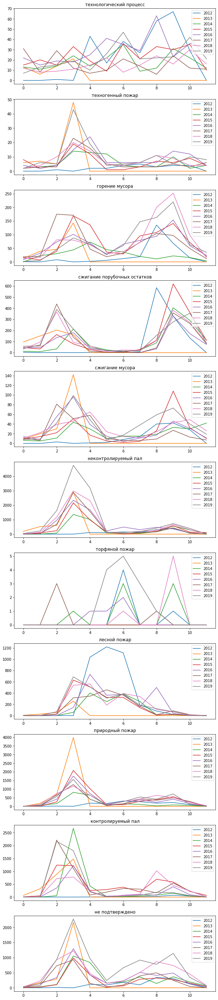

In [30]:
fig, axs = plt.subplots(len(fire_types), figsize=(10, 50))

fire_type_month_probability = {}
fire_type_month_dist = []

for index_, fire_type in enumerate(fire_types):
    avg = np.zeros((1, 12))
    for index, df in enumerate(features_list):
        new_df = df.groupby(['fire_type_name', 'month']).count().reset_index()
        new_df = new_df[new_df['fire_type_name'] == fire_type]
        month_vals = new_df.month.values.tolist()
        month_count = new_df.fire_type.values.tolist()
        assert len(month_vals) == len(month_count)
        answers = [0] * 12
        for index, val in enumerate(month_vals):
            answers[val - 1] = month_count[index]
        avg += answers
        axs[index_].plot(np.arange(12), answers)
        axs[index_].set_title(fire_type)
        axs[index_].legend(years, loc="upper right")
    fire_type_month_probability[fire_type] = avg / avg.sum()
    if isinstance(fire_type_month_dist, list):
        fire_type_month_dist = avg / avg.sum()
    else:
        fire_type_month_dist = np.concatenate((fire_type_month_dist, avg / avg.sum()))

Вообще непонтно, что по торфяным пожрам делать)

По остальным: <br>
 -сжигание порубочных остатков (2-3, 9-10) <br>
 -горение мусора (2-4, 7-9) <br>
 -природный пожар (3) <br>
 -техногенный пожар (3) <br>
 -лесной пожар (2-5) <br>
 -сжигание мусора (3, 9) <br>
 -технологический процесс (примерно равномерно) <br>
 -неконтролируемый пал (3-4) <br>
 -контролируемый пал (2-3) <br>

In [34]:
df_features.groupby('fire_type').count()['fire_type_name']

fire_type
1      1823
2       636
3      5177
4     10302
5      2366
6     47064
7        39
8     16114
9     31668
10    27768
11    31914
Name: fire_type_name, dtype: int64

In [9]:
fire_types = ['технологический процесс', 'техногенный пожар', 'горение мусора', 'сжигание порубочных остатков',
'сжигание мусора', 'неконтролируемый пал', 'торфяной пожар', 'лесной пожар', 'природный пожар', 'контролируемый пал',
'не подтверждено']
fire_type_danger_months = {
    'сжигание порубочных остатков': [2, 3, 9, 10],
    'горение мусора': [2, 3, 4, 7, 8, 9],
    'природный пожар': [3],
    'техногенный пожар': [3],
    'лесной пожар': [2, 3, 4, 5],
    'сжигание мусора': [3, 9],
    'технологический процесс': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
    'неконтролируемый пал': [3, 4],
    'контролируемый пал': [2, 3],
    'не подтверждено': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
    'торфяной пожар': [1, 2]
}

In [35]:
def plot_map_fire(df_features, fire_type):
    coords = df_features[df_features['fire_type_name'] == fire_type][['longitude', 'latitude']].values.tolist()
    coords_x_long = [x[0] for x in coords]
    coords_y_lat = [x[1] for x in coords]
    plt.scatter(coords_x_long, coords_y_lat, label=fire_type, s=0.5)
    plt.legend(loc='upper left');
    plt.show()

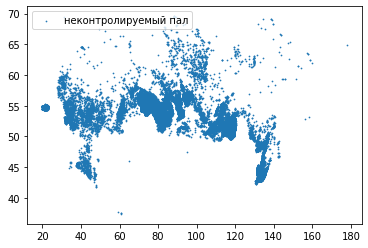

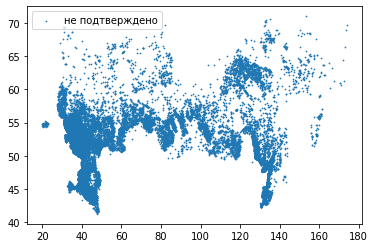

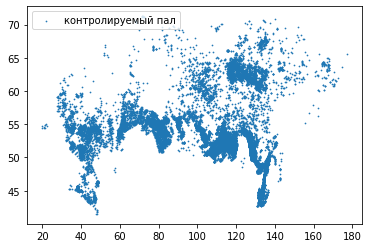

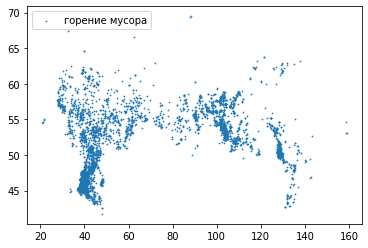

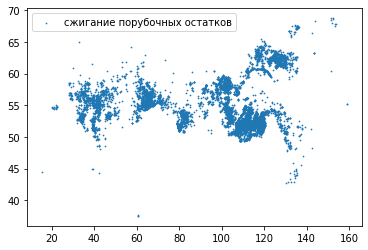

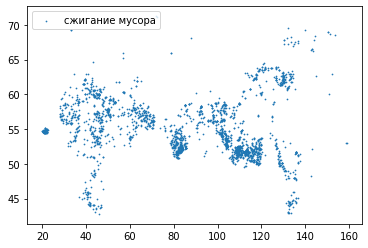

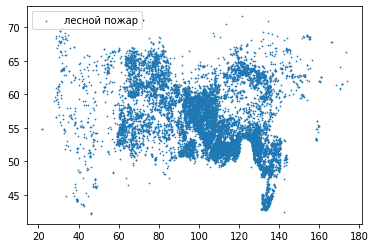

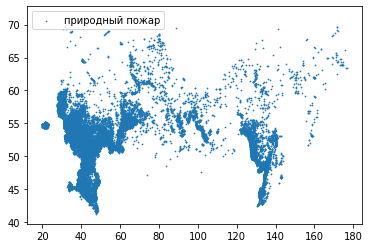

In [36]:
plot_map_fire(df_features, 'неконтролируемый пал')
plot_map_fire(df_features, 'не подтверждено')
plot_map_fire(df_features, 'контролируемый пал')
plot_map_fire(df_features, 'горение мусора')
plot_map_fire(df_features, 'сжигание порубочных остатков')
plot_map_fire(df_features, 'сжигание мусора')
plot_map_fire(df_features, 'лесной пожар')
plot_map_fire(df_features, 'природный пожар')

In [23]:
fire_types = ['технологический процесс', 'техногенный пожар', 'горение мусора', 'сжигание порубочных остатков',
'сжигание мусора', 'неконтролируемый пал', 'торфяной пожар', 'лесной пожар', 'природный пожар', 'контролируемый пал',
'не подтверждено']

In [24]:
controled = df_features[df_features['fire_type_name'] == 'контролируемый пал'][['longitude', 'latitude']].values.tolist()
uncontroled = df_features[df_features['fire_type_name'] == 'неконтролируемый пал'][['longitude', 'latitude']].values.tolist()
controled_df = df_features[df_features['fire_type_name'] == 'контролируемый пал']
uncontroled_df = df_features[df_features['fire_type_name'] == 'неконтролируемый пал']
contr_uncontr_df = pd.concat([controled_df, uncontroled_df])

In [26]:
fig = px.scatter_3d(contr_uncontr_df, x='longitude', y='latitude', z='year', color='fire_type')
fig.show()